In [53]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16, ResNet50, InceptionV3
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
import matplotlib.pyplot as plt
import pandas as pd
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import os
import numpy as np

In [54]:
train_data_path = r"C:\Users\Alaa\Desktop\intel-image-classification\seg_train\seg_train"
test_data_path = r"C:\Users\Alaa\Desktop\intel-image-classification\seg_test\seg_test"
prediction_data_path= r"C:\Users\Alaa\Desktop\intel-image-classification\seg_pred\seg_pred"

input_size = (150, 150)
batch_size = 32
num_classes = 6


In [55]:
train_datagen = ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)
test_datagen = ImageDataGenerator(rescale=1./255)
prediction_datagen = image.ImageDataGenerator(rescale=1./255)


In [56]:
train_generator = train_datagen.flow_from_directory(
    train_data_path,
    target_size=input_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'  
)


test_generator = test_datagen.flow_from_directory(
    test_data_path,
    target_size=input_size,
    batch_size=batch_size,
    class_mode='categorical')



image_files = [os.path.join(prediction_data_path, file) for file in os.listdir(prediction_data_path)]

images = []

for file_path in image_files:
    img = load_img(file_path, target_size=input_size)
    img_array = img_to_array(img)
    img_array /= 255.0  
    images.append(img_array)

prediction_data = np.array(images)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [57]:
model_alexnet = models.Sequential()

model_alexnet.add(layers.Conv2D(96, (11, 11), strides=(4, 4), padding='same', activation='relu', input_shape=(150, 150, 3)))
model_alexnet.add(layers.MaxPooling2D((3, 3), strides=(2, 2)))
model_alexnet.add(layers.Conv2D(256, (5, 5), padding='same', activation='relu'))
model_alexnet.add(layers.MaxPooling2D((3, 3), strides=(2, 2)))
model_alexnet.add(layers.Conv2D(384, (3, 3), padding='same', activation='relu'))
model_alexnet.add(layers.Conv2D(384, (3, 3), padding='same', activation='relu'))
model_alexnet.add(layers.Conv2D(256, (3, 3), padding='same', activation='relu'))
model_alexnet.add(layers.MaxPooling2D((3, 3), strides=(2, 2)))
model_alexnet.add(layers.Flatten())

# Fully Connected Layers
model_alexnet.add(layers.Dense(4096, activation='relu'))
model_alexnet.add(Dropout(.5))
model_alexnet.add(layers.Dense(4096, activation='relu'))
model_alexnet.add(Dropout(.5))
model_alexnet.add(layers.Dense(1000, activation='relu'))

# Output Layer
model_alexnet.add(layers.Dense(num_classes, activation='softmax'))

model_alexnet.compile(optimizer=tf.optimizers.Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

callbacks = [
    ModelCheckpoint('alexnet_best_weights.h5', save_best_only=True, save_weights_only=True, monitor='val_accuracy', mode='max'),
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)  
]
history_alexnet = model_alexnet.fit(train_generator, epochs=10, validation_data=test_generator, callbacks=[callbacks])
model_alexnet.summary()

Epoch 1/10
439/439 [==============================] - 219s 494ms/step - loss: 1.5058 - accuracy: 0.3464 - val_loss: 1.2575 - val_accuracy: 0.5017
Epoch 2/10
439/439 [==============================] - 235s 535ms/step - loss: 1.2176 - accuracy: 0.5200 - val_loss: 1.1214 - val_accuracy: 0.5510
Epoch 3/10
439/439 [==============================] - 232s 528ms/step - loss: 1.1312 - accuracy: 0.5602 - val_loss: 1.0816 - val_accuracy: 0.5643
Epoch 4/10
439/439 [==============================] - 189s 430ms/step - loss: 1.0782 - accuracy: 0.5718 - val_loss: 0.9986 - val_accuracy: 0.6133
Epoch 5/10
439/439 [==============================] - 193s 439ms/step - loss: 1.0476 - accuracy: 0.5865 - val_loss: 1.0156 - val_accuracy: 0.6060
Epoch 6/10
439/439 [==============================] - 193s 438ms/step - loss: 1.0044 - accuracy: 0.6092 - val_loss: 1.0367 - val_accuracy: 0.5870
Epoch 7/10
439/439 [==============================] - 207s 472ms/step - loss: 0.9937 - accuracy: 0.6072 - val_loss: 0.9356 -

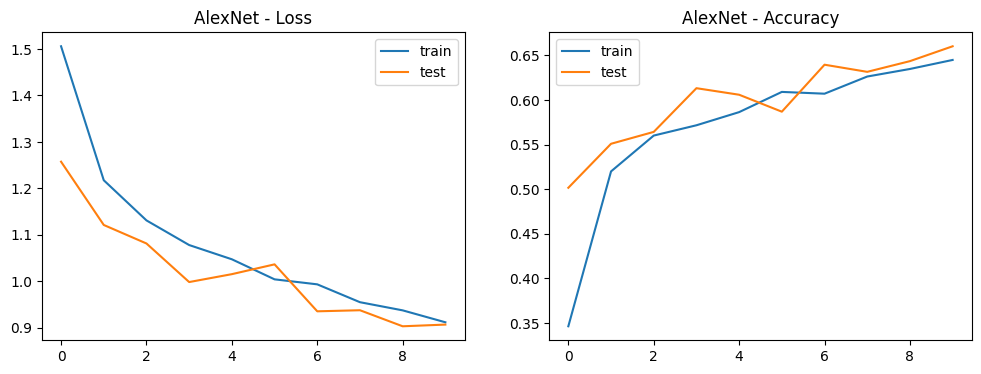

In [58]:
# Plot Loss and Accuracy Curves for AlexNet
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history_alexnet.history['loss'], label='train')
plt.plot(history_alexnet.history['val_loss'], label='test')
plt.title('AlexNet - Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_alexnet.history['accuracy'], label='train')
plt.plot(history_alexnet.history['val_accuracy'], label='test')
plt.title('AlexNet - Accuracy')
plt.legend()

plt.show()



In [59]:
model_alexnet.load_weights('alexnet_best_weights.h5')
predictions_alexnet = model_alexnet.predict(prediction_data)


229/229 [==============================] - 32s 140ms/step


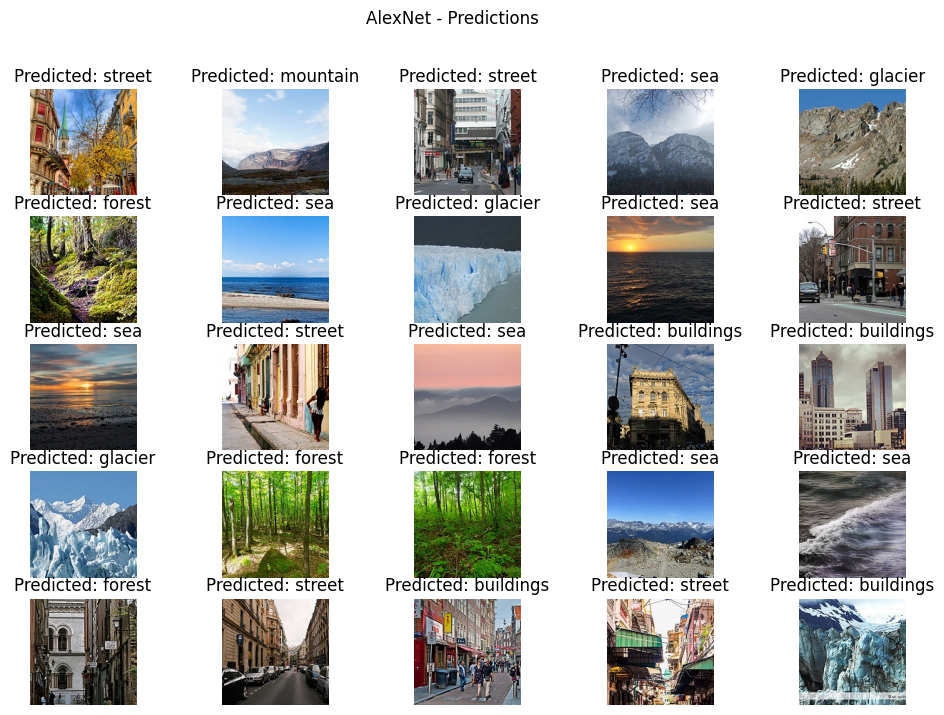

In [60]:
class_indices = train_generator.class_indices

plt.figure(figsize=(12, 8))
for j in range(25):
    plt.subplot(5, 5, j+1)
    plt.imshow(prediction_data[j])
    predicted_class_index = tf.argmax(predictions_alexnet[j]).numpy()
    predicted_class_name = [key for key, value in class_indices.items() if value == predicted_class_index][0]

    plt.title(f'Predicted: {predicted_class_name}')
    plt.axis('off')

plt.suptitle('AlexNet - Predictions')
plt.show()


# VGG

In [61]:
base_vgg = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
base_vgg.trainable = False

model_vgg = models.Sequential()
model_vgg.add(base_vgg)
model_vgg.add(layers.Flatten())
model_vgg.add(layers.Dense(256, activation='relu'))
model_vgg.add(layers.Dropout(0.5))
model_vgg.add(layers.Dense(num_classes, activation='softmax'))

model_vgg.compile(optimizer=tf.optimizers.Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

vgg_callbacks = [
    ModelCheckpoint('VGG_best_weights.h5', save_best_only=True, save_weights_only=True, monitor='val_accuracy', mode='max'),
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)  
]
history_vgg = model_vgg.fit(train_generator, epochs=5, validation_data=test_generator, callbacks=vgg_callbacks)

Epoch 1/5
439/439 [==============================] - 876s 2s/step - loss: 0.6013 - accuracy: 0.7790 - val_loss: 0.3861 - val_accuracy: 0.8560
Epoch 2/5
439/439 [==============================] - 877s 2s/step - loss: 0.4684 - accuracy: 0.8267 - val_loss: 0.3607 - val_accuracy: 0.8607
Epoch 3/5
439/439 [==============================] - 637s 1s/step - loss: 0.4285 - accuracy: 0.8435 - val_loss: 0.3465 - val_accuracy: 0.8717
Epoch 4/5
439/439 [==============================] - 590s 1s/step - loss: 0.4021 - accuracy: 0.8529 - val_loss: 0.3746 - val_accuracy: 0.8573
Epoch 5/5
439/439 [==============================] - 632s 1s/step - loss: 0.3879 - accuracy: 0.8559 - val_loss: 0.3219 - val_accuracy: 0.8867


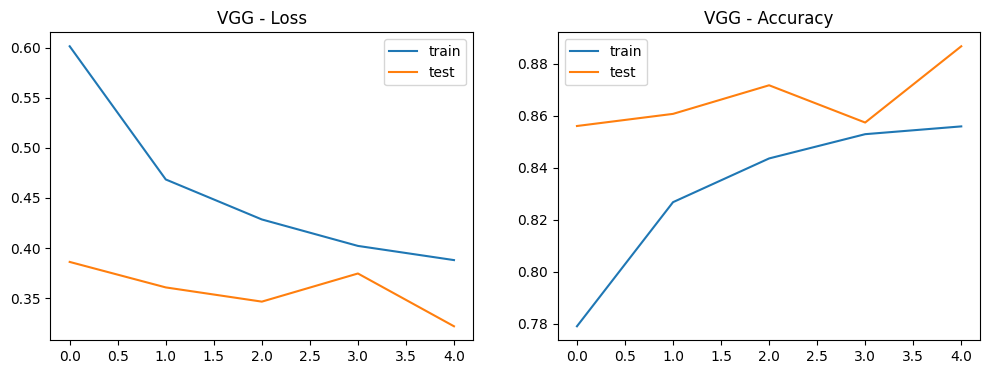

In [62]:
# Plot Loss and Accuracy Curves for VGG
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history_vgg.history['loss'], label='train')
plt.plot(history_vgg.history['val_loss'], label='test')
plt.title('VGG - Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_vgg.history['accuracy'], label='train')
plt.plot(history_vgg.history['val_accuracy'], label='test')
plt.title('VGG - Accuracy')
plt.legend()

plt.show()



In [63]:
model_vgg.load_weights('VGG_best_weights.h5')

predictions_VGG = model_vgg.predict(prediction_data)


229/229 [==============================] - 260s 1s/step


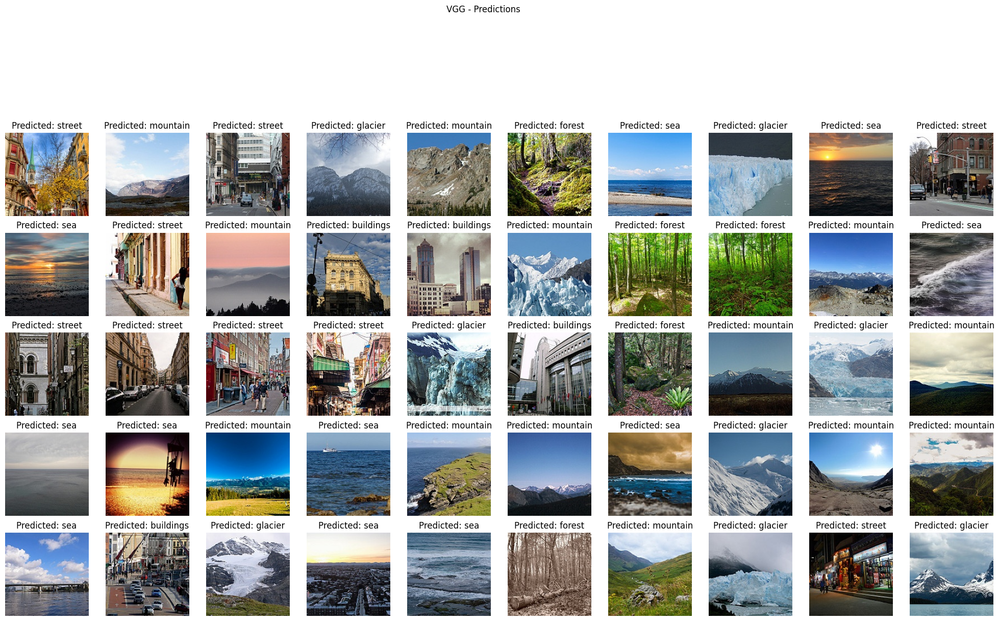

In [64]:
class_indices = train_generator.class_indices

plt.figure(figsize=(25, 25))
for j in range(50):
    plt.subplot(10, 10, j+1)
    plt.imshow(prediction_data[j])
    predicted_class_index = tf.argmax(predictions_VGG[j]).numpy()
    predicted_class_name = [key for key, value in class_indices.items() if value == predicted_class_index][0]

    plt.title(f'Predicted: {predicted_class_name}')
    plt.axis('off')

plt.suptitle('VGG - Predictions')
plt.show()


# Resnet

In [65]:
base_resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
base_resnet.trainable = False

model_resnet = models.Sequential()
model_resnet.add(base_resnet)
model_resnet.add(layers.Flatten())
model_resnet.add(layers.Dense(256, activation='relu'))
model_resnet.add(layers.Dropout(0.5))
model_resnet.add(layers.Dense(6, activation='softmax'))

model_resnet.compile(optimizer=tf.optimizers.Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

resnet_callbacks = [
    ModelCheckpoint('resnet_best_weights.h5', save_best_only=True, save_weights_only=True, monitor='val_accuracy', mode='max'),
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)  
]
history_resnet = model_resnet.fit(train_generator, epochs=5, validation_data=test_generator,callbacks=[resnet_callbacks])


Epoch 1/5
439/439 [==============================] - 335s 754ms/step - loss: 1.7119 - accuracy: 0.2622 - val_loss: 1.4936 - val_accuracy: 0.3753
Epoch 2/5
439/439 [==============================] - 345s 785ms/step - loss: 1.5292 - accuracy: 0.2971 - val_loss: 1.3541 - val_accuracy: 0.4797
Epoch 3/5
439/439 [==============================] - 411s 936ms/step - loss: 1.5060 - accuracy: 0.3083 - val_loss: 1.3696 - val_accuracy: 0.4630
Epoch 4/5
439/439 [==============================] - 407s 926ms/step - loss: 1.4987 - accuracy: 0.3018 - val_loss: 1.2359 - val_accuracy: 0.4650
Epoch 5/5
439/439 [==============================] - 414s 942ms/step - loss: 1.4423 - accuracy: 0.3294 - val_loss: 1.2438 - val_accuracy: 0.4583


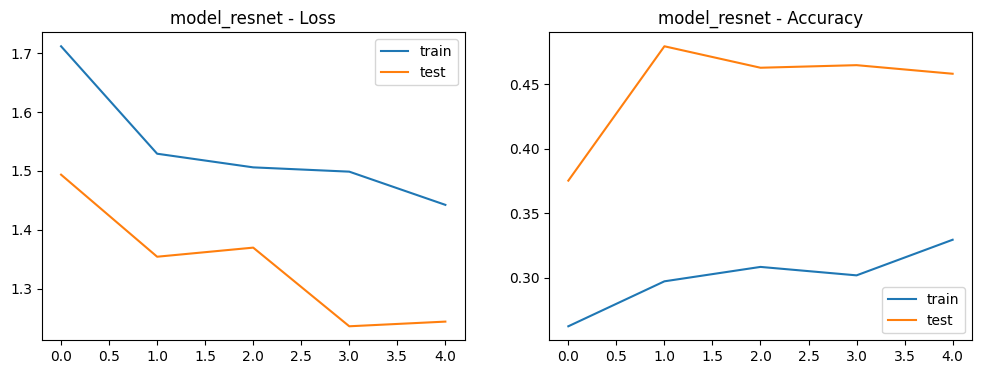

In [66]:
# Plot Loss and Accuracy Curves for Resnet
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history_resnet.history['loss'], label='train')
plt.plot(history_resnet.history['val_loss'], label='test')
plt.title('model_resnet - Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_resnet.history['accuracy'], label='train')
plt.plot(history_resnet.history['val_accuracy'], label='test')
plt.title('model_resnet - Accuracy')
plt.legend()

plt.show()



In [67]:
model_resnet.load_weights('resnet_best_weights.h5')

predictions_resnet = model_resnet.predict(prediction_data)


229/229 [==============================] - 159s 686ms/step


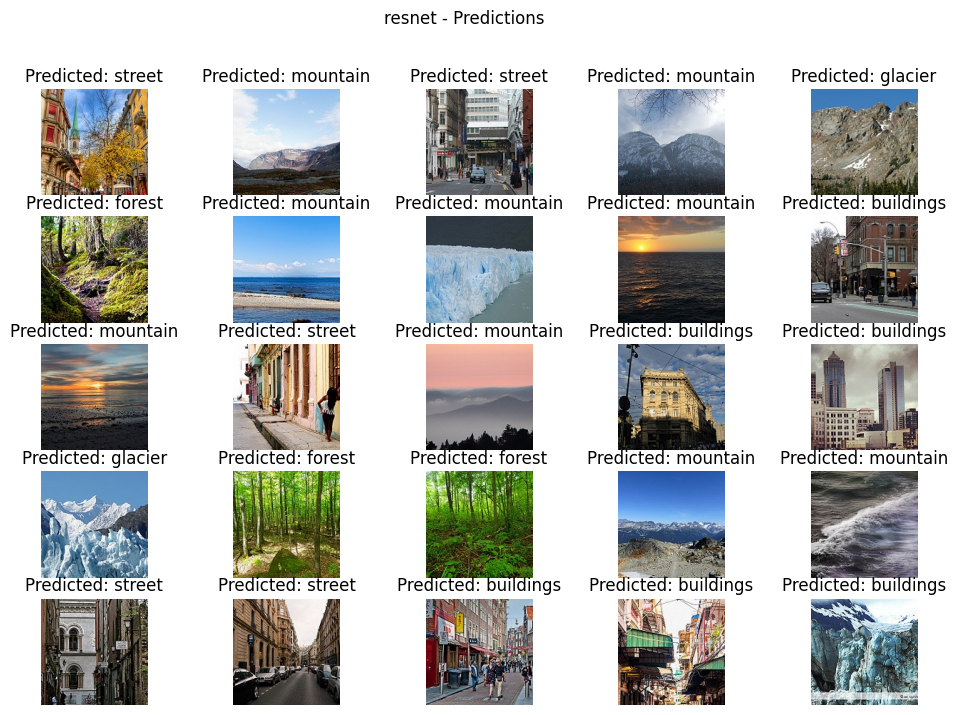

In [68]:
class_indices = train_generator.class_indices

plt.figure(figsize=(12, 8))
for j in range(25):
    plt.subplot(5, 5, j+1)
    plt.imshow(prediction_data[j])
    predicted_class_index = tf.argmax(predictions_resnet[j]).numpy()
    predicted_class_name = [key for key, value in class_indices.items() if value == predicted_class_index][0]

    plt.title(f'Predicted: {predicted_class_name}')
    plt.axis('off')

plt.suptitle('resnet - Predictions')
plt.show()


# Inception

In [69]:
base_inception = InceptionV3(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
base_inception.trainable = False

model_inception = models.Sequential()
model_inception.add(base_inception)
model_inception.add(layers.Flatten())
model_inception.add(layers.Dense(256, activation='relu'))
model_inception.add(layers.Dropout(0.5))
model_inception.add(layers.Dense(6, activation='softmax'))

model_inception.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

inception_callbacks = [
    ModelCheckpoint('inception_best_weights.h5', save_best_only=True, save_weights_only=True, monitor='val_accuracy', mode='max'),
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)  
]

history_inception = model_inception.fit(train_generator, epochs=5, validation_data=test_generator, callbacks=inception_callbacks)


Epoch 1/5
439/439 [==============================] - 202s 450ms/step - loss: 0.9099 - accuracy: 0.7860 - val_loss: 0.3680 - val_accuracy: 0.8640
Epoch 2/5
439/439 [==============================] - 175s 398ms/step - loss: 0.5018 - accuracy: 0.8200 - val_loss: 0.3116 - val_accuracy: 0.8777
Epoch 3/5
439/439 [==============================] - 141s 322ms/step - loss: 0.4589 - accuracy: 0.8371 - val_loss: 0.2981 - val_accuracy: 0.8880
Epoch 4/5
439/439 [==============================] - 147s 335ms/step - loss: 0.4375 - accuracy: 0.8465 - val_loss: 0.3001 - val_accuracy: 0.8850
Epoch 5/5
439/439 [==============================] - 150s 342ms/step - loss: 0.4120 - accuracy: 0.8511 - val_loss: 0.3284 - val_accuracy: 0.8790


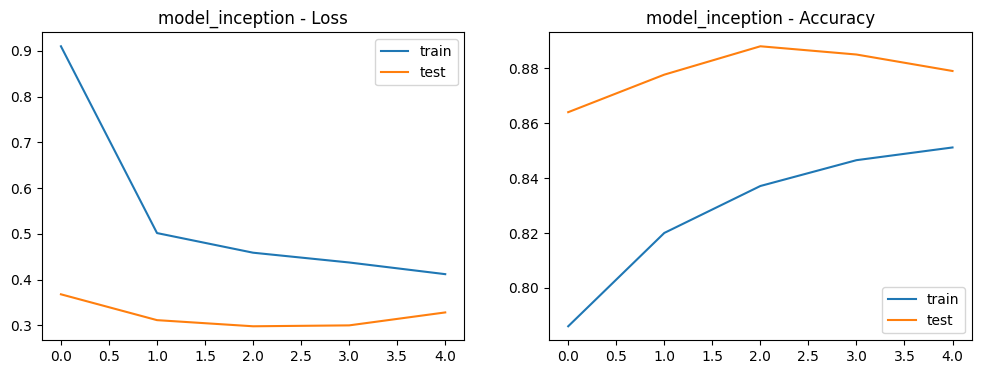

In [70]:
# Plot Loss and Accuracy Curves for Inception
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history_inception.history['loss'], label='train')
plt.plot(history_inception.history['val_loss'], label='test')
plt.title('model_inception - Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_inception.history['accuracy'], label='train')
plt.plot(history_inception.history['val_accuracy'], label='test')
plt.title('model_inception - Accuracy')
plt.legend()

plt.show()



In [71]:
model_inception.load_weights('inception_best_weights.h5')

predictions_inception = model_inception.predict(prediction_data)


229/229 [==============================] - 47s 198ms/step


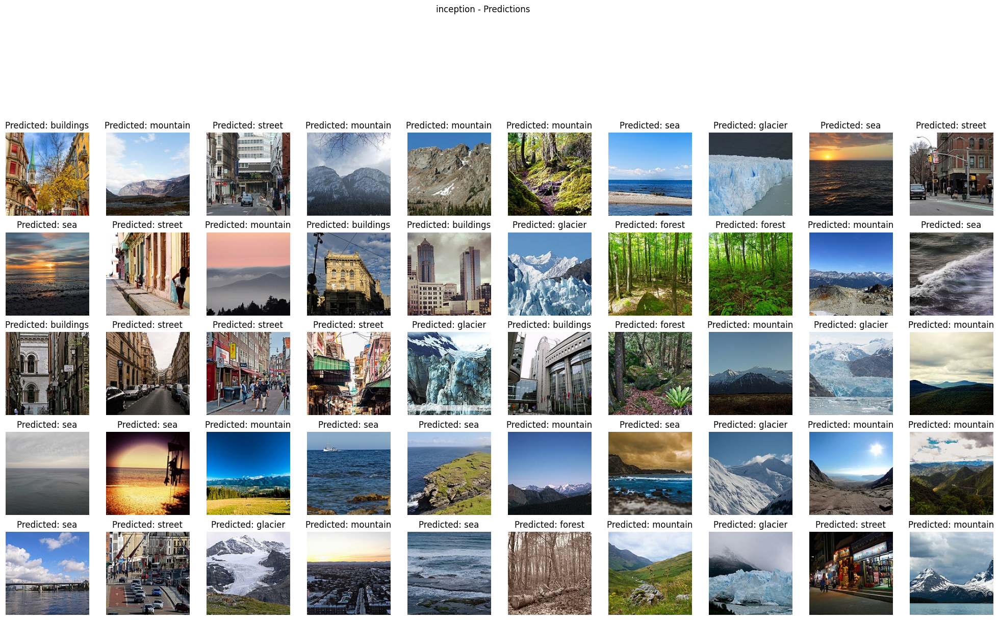

In [72]:
class_indices = train_generator.class_indices

plt.figure(figsize=(25, 25))
for j in range(50):
    plt.subplot(10, 10, j+1)
    plt.imshow(prediction_data[j])
    predicted_class_index = tf.argmax(predictions_inception[j]).numpy()
    predicted_class_name = [key for key, value in class_indices.items() if value == predicted_class_index][0]

    plt.title(f'Predicted: {predicted_class_name}')
    plt.axis('off')

plt.suptitle('inception - Predictions')
plt.show()


In [73]:
# The best two models were vgg and inception while alex net was the third best and resnet was the worst since its accuracy was low and its predictions 
# had lots of mistakes (around  mistakes in the 11 pics while alexnet had around 9 mistakes)
#to determine the best one between vgg and inception :-
# For the VGG model:

# Final training accuracy: 86.61%
# Final validation accuracy: 87.93%
# Final training loss: 0.3762
# Final validation loss: 0.3253
# For the Inception model:

# Final training accuracy: 84.82%
# Final validation accuracy: 89.30%
# Final training loss: 0.4335
# Final validation loss: 0.2923
# Based on the these metrics, the Inception model performs better on the validation set with a higher accuracy of 89.30% 
# compared to VGG's 87.93%. Additionally, Inception achieves a lower validation loss of 0.2923 compared to VGG's 0.3253. 
# but the Inception performs better and has less mistakes in the predictions than the VGG 
# and since it perofroms better on unseen data then inception model is the best model